In [1]:
!nvidia-smi

Fri Dec  8 09:50:51 2023       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 470.161.03   Driver Version: 470.161.03   CUDA Version: 11.4     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla T4            Off  | 00000000:00:04.0 Off |                    0 |
| N/A   56C    P8    10W /  70W |      0MiB / 15109MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
|   1  Tesla T4            Off  | 00000000:00:05.0 Off |                    0 |
| N/A   

In [2]:
!pip install ultralytics

  Obtaining dependency information for ultralytics from https://files.pythonhosted.org/packages/5c/43/5147435b80050e57c13430a0e614a1c8c04f1d46e160e2326172db7e8176/ultralytics-8.0.225-py3-none-any.whl.metadata
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 660.1/660.1 kB 5.0 MB/s eta 0:00:00a 0:00:01


In [3]:
from ultralytics import YOLO
import os
import torch
from IPython.display import display, Image
from IPython import display
display.clear_output()
!yolo checks
print(f"Setup complete. Using torch {torch.__version__} ({torch.cuda.get_device_properties(0).name if torch.cuda.is_available() else 'CPU'})")

Ultralytics YOLOv8.0.225 🚀 Python-3.10.12 torch-2.0.0 CUDA:0 (Tesla T4, 15110MiB)
Setup complete ✅ (4 CPUs, 31.4 GB RAM, 5259.4/8062.4 GB disk)

OS                  Linux-5.15.133+-x86_64-with-glibc2.35
Environment         Kaggle
Python              3.10.12
Install             pip
RAM                 31.36 GB
CPU                 Intel Xeon 2.00GHz
CUDA                11.8

matplotlib          ✅ 3.7.3>=3.3.0
numpy               ✅ 1.24.3>=1.22.2
opencv-python       ✅ 4.8.1.78>=4.6.0
pillow              ✅ 9.5.0>=7.1.2
pyyaml              ✅ 6.0.1>=5.3.1
requests            ✅ 2.31.0>=2.23.0
scipy               ✅ 1.7.3>=1.4.1
torch               ✅ 2.0.0>=1.8.0
torchvision         ✅ 0.15.1>=0.9.0
tqdm                ✅ 4.66.1>=4.64.0
pandas              ✅ 2.1.3>=1.1.4
seaborn             ✅ 0.12.2>=0.11.0
psutil              ✅ 5.9.5
py-cpuinfo          ✅ 9.0.0
thop                ✅ 0.1.1-2209072238>=0.1.1
Setup complete. Using torch 2.0.0 (Tesla T4)


In [4]:
!mkdir trash_detection
%cd trash_detection

/kaggle/working/trash_detection


In [5]:
os.environ["DATASET_DIRECTORY"] = "/kaggle/working/trash_detection/datasets"

In [6]:
!pip install roboflow --quiet

from roboflow import Roboflow
rf = Roboflow(api_key="cZwTZmEXUeB06iSIJ79d")
project = rf.workspace("ed-mikael-bebic-iyvku").project("thesis-efjq4")
dataset = project.version(19).download("yolov8")

ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
jupyterlab 4.0.5 requires jupyter-lsp>=2.0.0, but you have jupyter-lsp 1.5.1 which is incompatible.
jupyterlab-lsp 5.0.0 requires jupyter-lsp>=2.0.0, but you have jupyter-lsp 1.5.1 which is incompatible.
jupyterlab-lsp 5.0.0 requires jupyterlab<5.0.0a0,>=4.0.6, but you have jupyterlab 4.0.5 which is incompatible.
pytoolconfig 1.2.6 requires packaging>=22.0, but you have packaging 21.3 which is incompatible.
tensorflowjs 4.13.0 requires packaging~=23.1, but you have packaging 21.3 which is incompatible.
ydata-profiling 4.5.1 requires numpy<1.24,>=1.16.0, but you have numpy 1.24.3 which is incompatible.


A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.24.3


loading Roboflow workspace...
loading Roboflow project...
Dependency ultralytics==8.0.196 is required but found version=8.0.225, to fix: `pip install ultralytics==8.0.196`



Extracting Dataset Version Zip to /kaggle/working/trash_detection/datasets/Thesis-19 in yolov8:: 100%|██████████| 3024/3024 [00:00<00:00, 4404.18it/s]


In [7]:
!pip install numpy==1.22.4

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 16.8/16.8 MB 57.1 MB/s eta 0:00:0000:0100:01
  Attempting uninstall: numpy
    Found existing installation: numpy 1.24.3
    Uninstalling numpy-1.24.3:
      Successfully uninstalled numpy-1.24.3
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
cudf 23.8.0 requires cupy-cuda11x>=12.0.0, which is not installed.
cuml 23.8.0 requires cupy-cuda11x>=12.0.0, which is not installed.
dask-cudf 23.8.0 requires cupy-cuda11x>=12.0.0, which is not installed.
apache-beam 2.46.0 requires dill<0.3.2,>=0.3.1.1, but you have dill 0.3.7 which is incompatible.
apache-beam 2.46.0 requires pyarrow<10.0.0,>=3.0.0, but you have pyarrow 11.0.0 which is incompatible.
chex 0.1.84 requires numpy>=1.24.1, but you have numpy 1.22.4 which is incompatible.
cudf 23.8.0 requires pandas<1.6.0dev0,>=1.3, but you have pandas 2.0.3 which is incompatible

In [8]:
%pwd

'/kaggle/working/trash_detection'

In [9]:
!pip uninstall --yes wandb

Found existing installation: wandb 0.16.0
Uninstalling wandb-0.16.0:
  Successfully uninstalled wandb-0.16.0


In [10]:
!yolo task=detect mode=train model=yolov8s.pt data=/kaggle/working/trash_detection/datasets/Thesis-19/data.yaml epochs=128 imgsz=640 device=[0,1]

100%|███████████████████████████████████████| 21.5M/21.5M [00:00<00:00, 166MB/s]
Ultralytics YOLOv8.0.225 🚀 Python-3.10.12 torch-2.0.0 CUDA:0 (Tesla T4, 15110MiB)
                                                       CUDA:1 (Tesla T4, 15110MiB)
engine/trainer: task=detect, mode=train, model=yolov8s.pt, data=/kaggle/working/trash_detection/datasets/Thesis-19/data.yaml, epochs=128, patience=50, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=[0, 1], workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, c

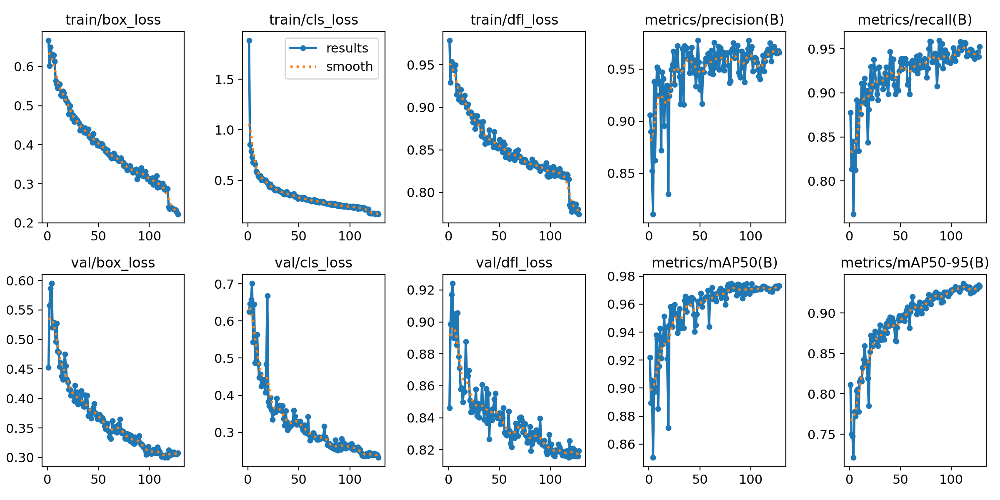

In [11]:
Image(filename=f'/kaggle/working/trash_detection/runs/detect/train/results.png', width=600)

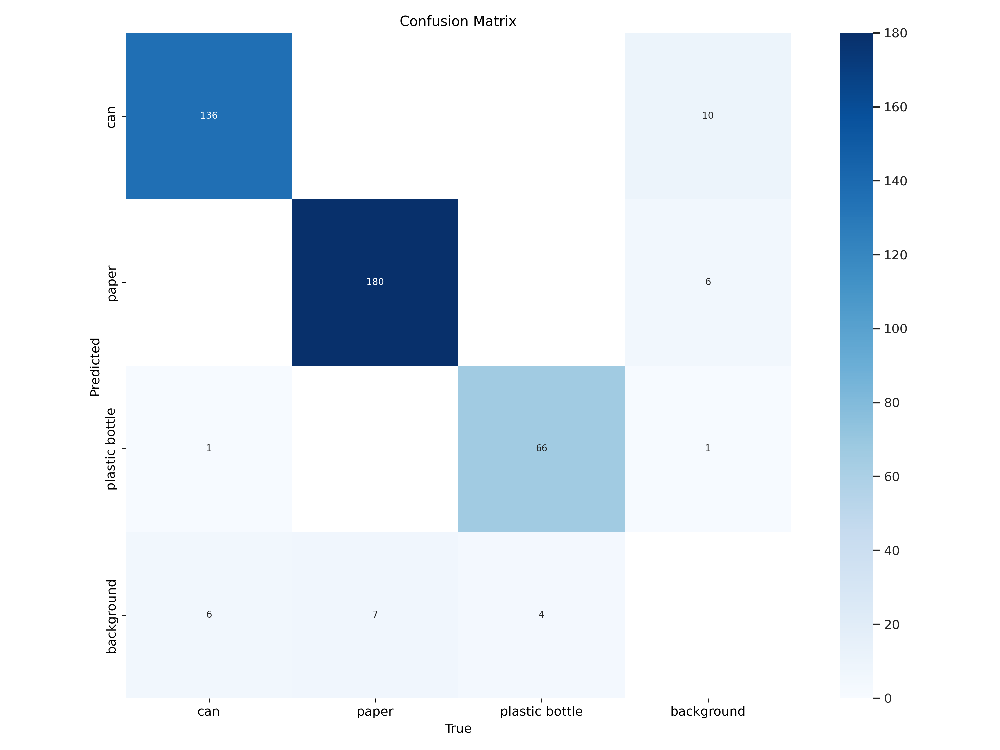

In [12]:
Image(filename=f'/kaggle/working/trash_detection/runs/detect/train/confusion_matrix.png', width=600)

In [13]:
!yolo task=detect mode=val model=/kaggle/working/trash_detection/runs/detect/train/weights/best.pt data=/kaggle/working/trash_detection/datasets/Thesis-19/data.yaml

Ultralytics YOLOv8.0.225 🚀 Python-3.10.12 torch-2.0.0 CUDA:0 (Tesla T4, 15110MiB)
Model summary (fused): 168 layers, 11126745 parameters, 0 gradients, 28.4 GFLOPs
val: Scanning /kaggle/working/trash_detection/datasets/Thesis-19/valid/labels.ca
                 Class     Images  Instances      Box(P          R      mAP50  m
                   all        153        400      0.963      0.951      0.973      0.937
                   can        153        143      0.938      0.949      0.971      0.937
                 paper        153        187       0.97      0.963      0.986      0.954
        plastic bottle        153         70      0.981      0.943      0.962       0.92
Speed: 0.8ms preprocess, 6.8ms inference, 0.0ms loss, 8.9ms postprocess per image
Results saved to runs/detect/val
💡 Learn more at https://docs.ultralytics.com/modes/val


In [14]:
!yolo task=detect mode=predict model=/kaggle/working/trash_detection/runs/detect/train/weights/best.pt conf=0.5 source=/kaggle/working/trash_detection/datasets/Thesis-19/test/images save_txt=true save_conf=true

Ultralytics YOLOv8.0.225 🚀 Python-3.10.12 torch-2.0.0 CUDA:0 (Tesla T4, 15110MiB)
Model summary (fused): 168 layers, 11126745 parameters, 0 gradients, 28.4 GFLOPs

image 1/60 /kaggle/working/trash_detection/datasets/Thesis-19/test/images/-109_jpg.rf.d6d11a408bc2c05ae3b26f72935d69c7.jpg: 384x640 1 can, 74.9ms
image 2/60 /kaggle/working/trash_detection/datasets/Thesis-19/test/images/-179_jpg.rf.c5d4919d848c2117ed3d45efba3abc10.jpg: 384x640 4 plastic bottles, 10.7ms
image 3/60 /kaggle/working/trash_detection/datasets/Thesis-19/test/images/-180_jpg.rf.f78d250f8dfb481b7ade2685038fc7ed.jpg: 384x640 1 can, 10.8ms
image 4/60 /kaggle/working/trash_detection/datasets/Thesis-19/test/images/-32_jpg.rf.837de2514d848604638047cb139d2ec4.jpg: 384x640 1 can, 10.7ms
image 5/60 /kaggle/working/trash_detection/datasets/Thesis-19/test/images/-39_jpg.rf.8b7c6e4d656a4031d5e10a536f57c3f9.jpg: 384x640 1 can, 10.7ms
image 6/60 /kaggle/working/trash_detection/datasets/Thesis-19/test/images/-41_jpg.rf.713c4ef260a

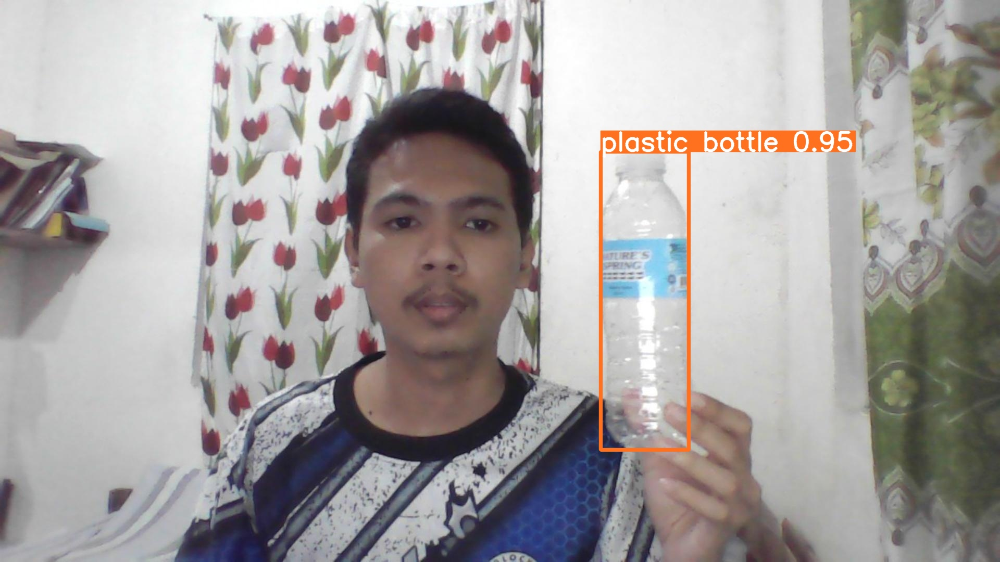

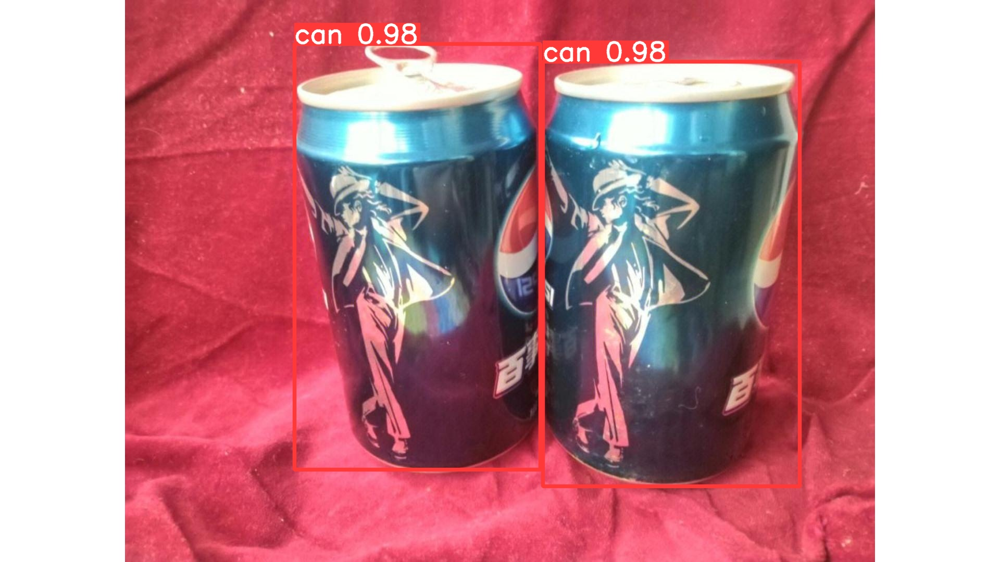

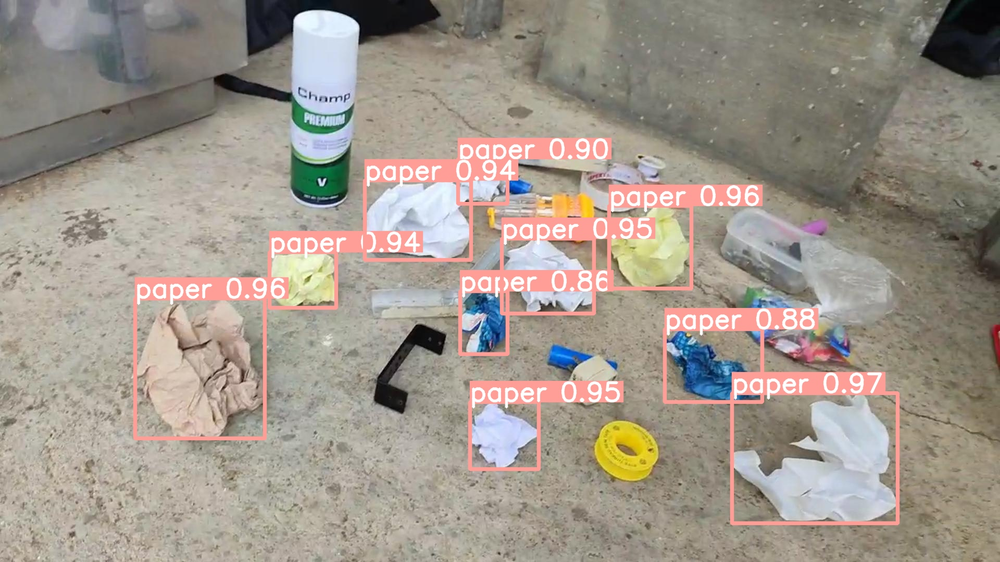

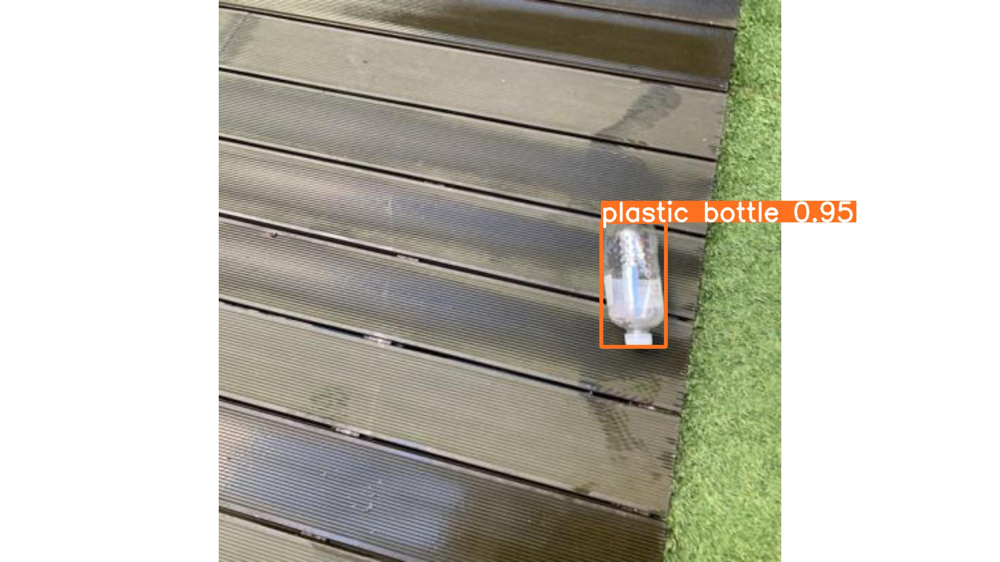

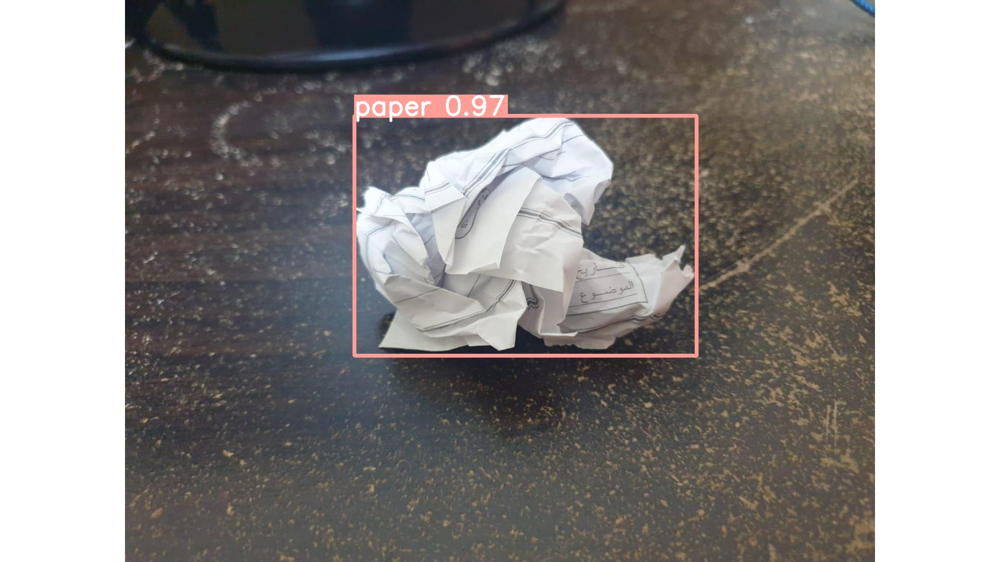

...

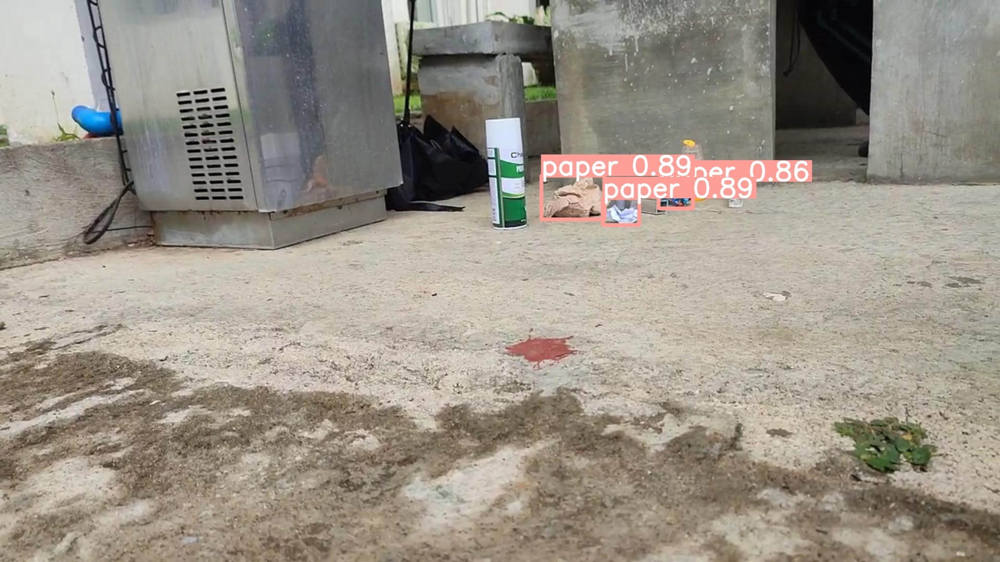

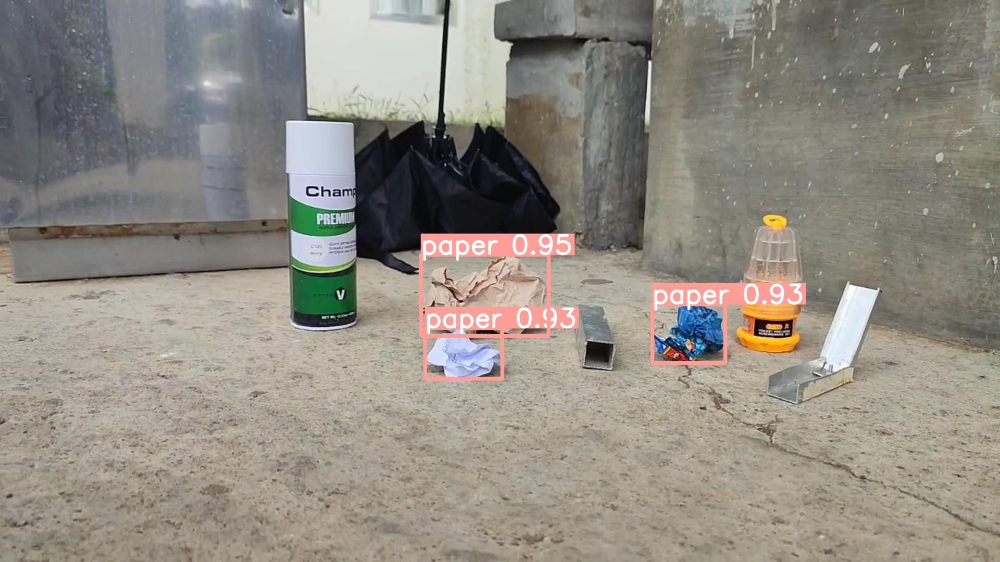

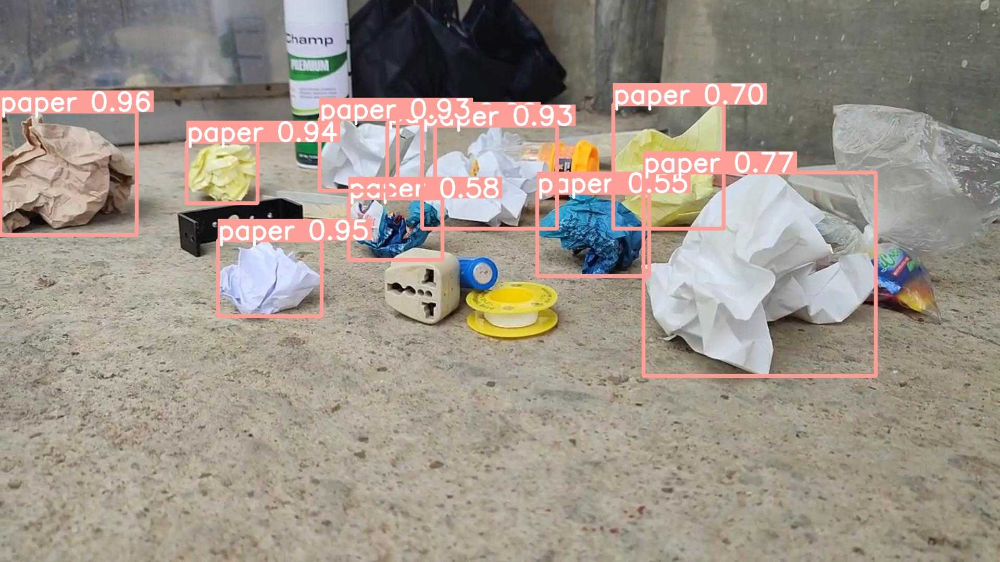

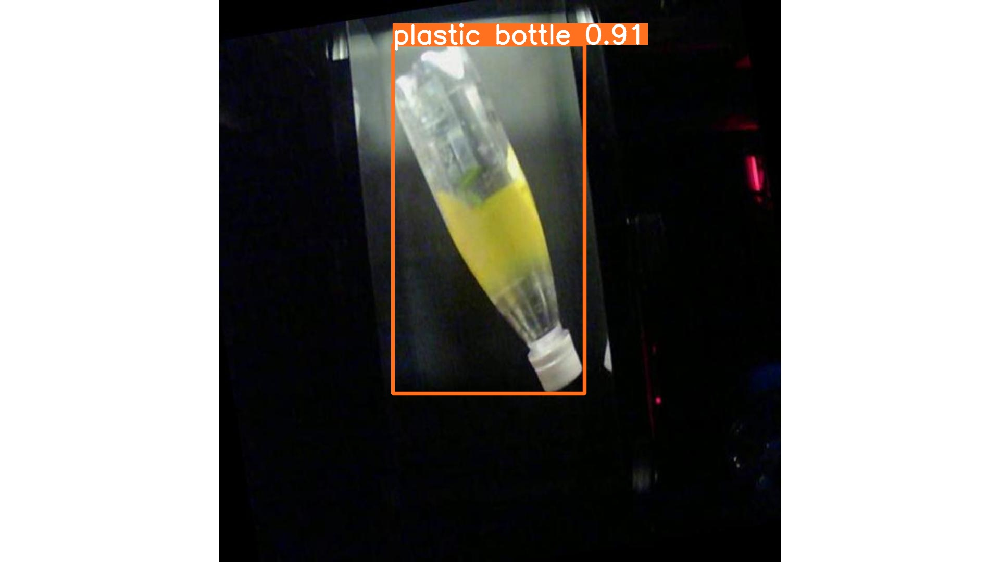

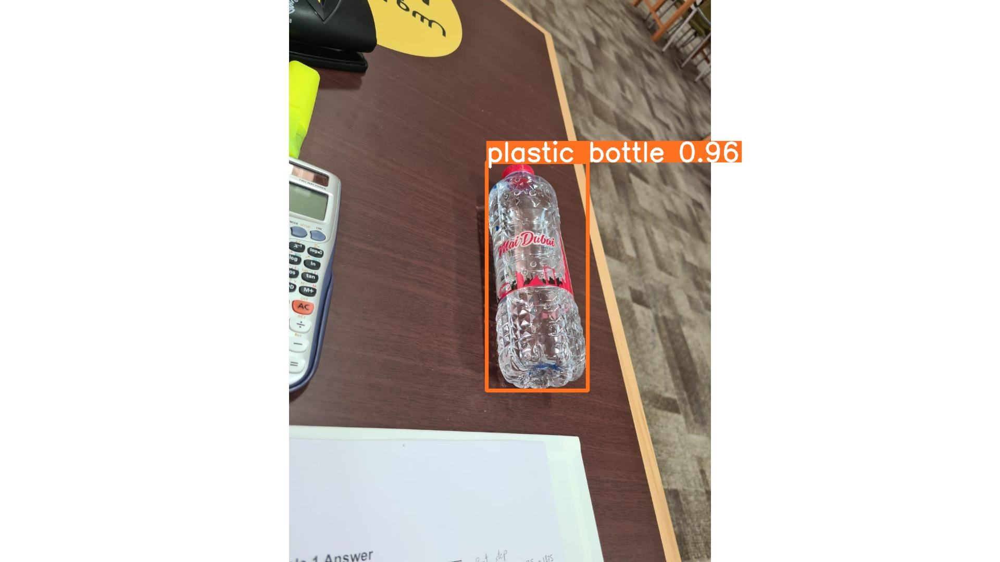

In [15]:
import glob
from IPython.display import Image, display

for image_path in glob.glob(f'/kaggle/working/trash_detection/runs/detect/predict/*.jpg'):
      display(Image(filename=image_path, height=600))
      print("\n")